# Libraries Importation

In [2]:
import requests
import pandas as pd
pd.set_option('display.max_column', 96)
pd.set_option('display.max_rows', 150)
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import warnings
from tqdm import tqdm
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split, learning_curve
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import classification_report

from imblearn.over_sampling import SMOTE

import lightgbm as lgb
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV

import shap

import joblib

# Download Dataset

In [3]:
# FILEPATH: /Users/theob/Desktop/DSBA ESSEC CENTRAL/Cours/Courses/Foundation of Machine Learning (FLM)/Homework/Final Project/FLM_Final_Project.ipynb
dataset_path = "downloaded_data.csv"

# Check if the dataset file already exists
if not os.path.exists(dataset_path):
    response = requests.get("https://raw.githubusercontent.com/amankharwal/Website-data/master/bank.csv")

    # Check if the request was successful (status code 200)
    if response.status_code == 200:
        # Save the content of the response to a local CSV file
        with open(dataset_path, "wb") as f:
            f.write(response.content)
        print("CSV file downloaded successfully")
    else:
        print("Failed to download CSV file. Status code:", response.status_code)
        
print("Already Download")
# Read the CSV file into a Pandas DataFrame
df = pd.read_csv(dataset_path)


Already Download


# Exploratory Data Analysis

In [4]:
data = pd.read_csv("downloaded_data.csv")
df = data.copy()

In [5]:
df

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share (Yuan ¥),Per Share Net profit before tax (Yuan ¥),Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,0.780985,1.256969e-04,0.000000e+00,0.458143,7.250725e-04,0.000000,0.147950,0.147950,0.147950,0.169141,0.311664,0.017560,0.095921,0.138736,0.022102,0.848195,0.688979,0.688979,0.217535,4.980000e+09,0.000327,0.263100,0.363725,0.002259,0.001208,0.629951,0.021266,0.207576,0.792424,0.005024,0.390284,0.006479,0.095885,0.137757,0.398036,0.086957,0.001814,0.003487,1.820926e-04,1.165007e-04,0.032903,0.034164,0.392913,0.037135,0.672775,0.166673,0.190643,0.004094,0.001997,1.473360e-04,0.147308,0.334015,0.276920,0.001036,0.676269,0.721275,0.339077,2.559237e-02,0.903225,0.002022,0.064856,7.010000e+08,6.550000e+09,0.593831,4.580000e+08,0.671568,0.424206,0.676269,0.339077,0.126549,0.637555,0.458609,0.520382,0.312905,0.118250,0,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,0.781506,2.897851e-04,0.000000e+00,0.461867,6.470647e-04,0.000000,0.182251,0.182251,0.182251,0.208944,0.318137,0.021144,0.093722,0.169918,0.022080,0.848088,0.689693,0.689702,0.217620,6.110000e+09,0.000443,0.264516,0.376709,0.006016,0.004039,0.635172,0.012502,0.171176,0.828824,0.005059,0.376760,0.005835,0.093743,0.168962,0.397725,0.064468,0.001286,0.004917,9

In [6]:
df.shape

(6819, 96)

In [7]:
df.dtypes.value_counts()

float64    93
int64       3
Name: count, dtype: int64

In [8]:
df.dtypes

Bankrupt?                                                     int64
 ROA(C) before interest and depreciation before interest    float64
 ROA(A) before interest and % after tax                     float64
 ROA(B) before interest and depreciation after tax          float64
 Operating Gross Margin                                     float64
 Realized Sales Gross Margin                                float64
 Operating Profit Rate                                      float64
 Pre-tax net Interest Rate                                  float64
 After-tax net Interest Rate                                float64
 Non-industry income and expenditure/revenue                float64
 Continuous interest rate (after tax)                       float64
 Operating Expense Rate                                     float64
 Research and development expense rate                      float64
 Cash flow rate                                             float64
 Interest-bearing debt interest rate            

In [9]:
missing_values_count = df.isnull().sum().sort_values(ascending=False)
print(missing_values_count)


Bankrupt?                                                   0
 ROA(C) before interest and depreciation before interest    0
 Total expense/Assets                                       0
 Total income/Total expense                                 0
 Retained Earnings to Total Assets                          0
 Long-term Liability to Current Assets                      0
 Current Liabilities/Equity                                 0
 Working Capital/Equity                                     0
 Current Liabilities/Liability                              0
 Inventory/Current Liability                                0
 Inventory/Working Capital                                  0
 Operating Funds to Liability                               0
 Current Liability to Assets                                0
 Cash/Current Liability                                     0
 Quick Assets/Current Liability                             0
 Cash/Total Assets                                          0
 Current

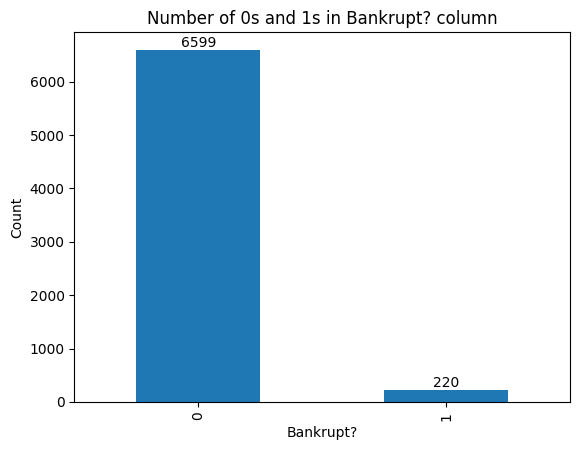

In [10]:
df['Bankrupt?'].value_counts().plot(kind='bar')
plt.xlabel('Bankrupt?')
plt.ylabel('Count')
plt.title('Number of 0s and 1s in Bankrupt? column')

# Add value of each bar
for i, v in enumerate(df['Bankrupt?'].value_counts()):
    plt.text(i, v, str(v), ha='center', va='bottom')

plt.show()


<span style="color:red">The dataset is highly imbalanced.</span>


  0%|          | 1/6819 [00:00<33:25,  3.40it/s]

  1%|          | 61/6819 [00:26<49:51,  2.26it/s]  


KeyboardInterrupt: 

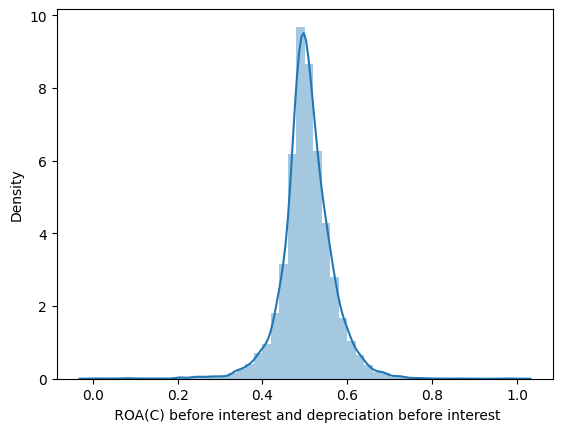

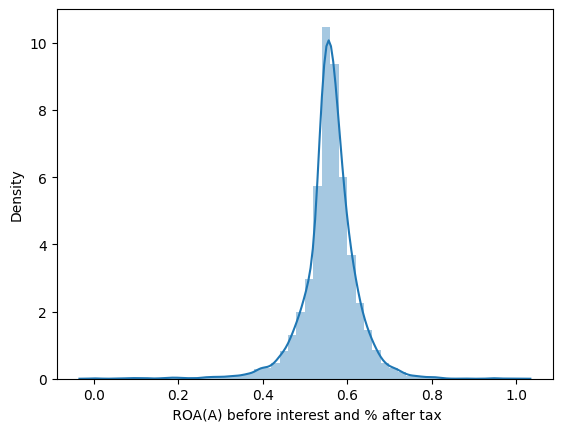

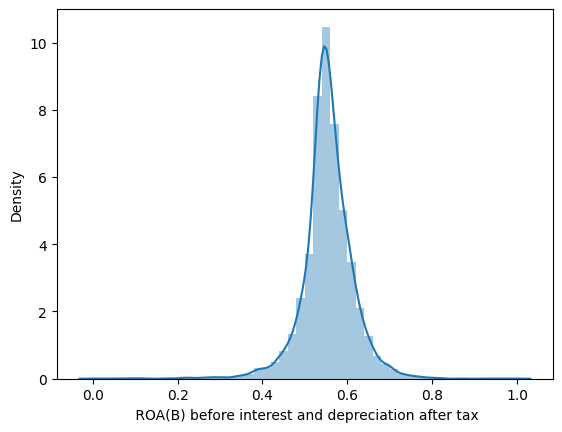

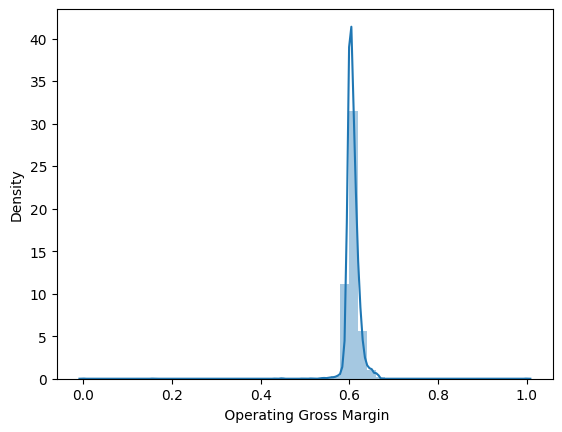

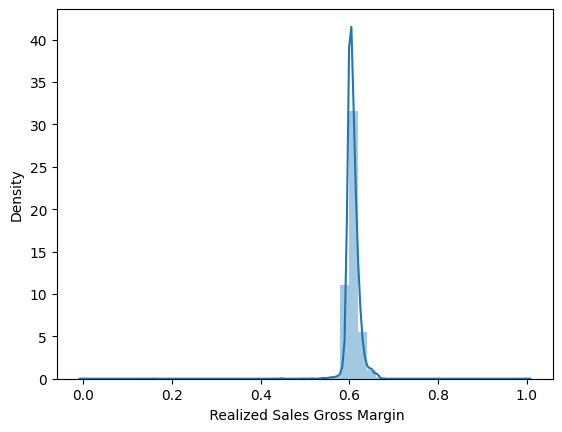

...

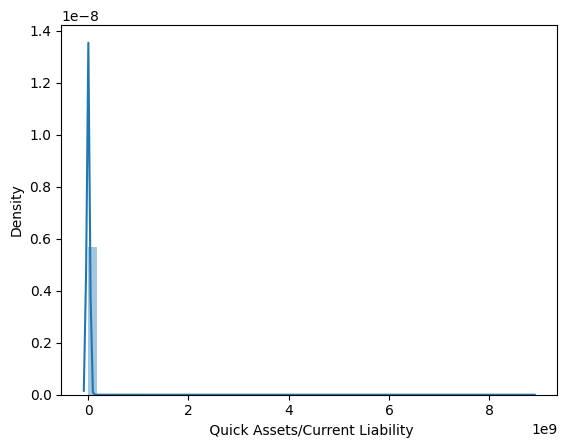

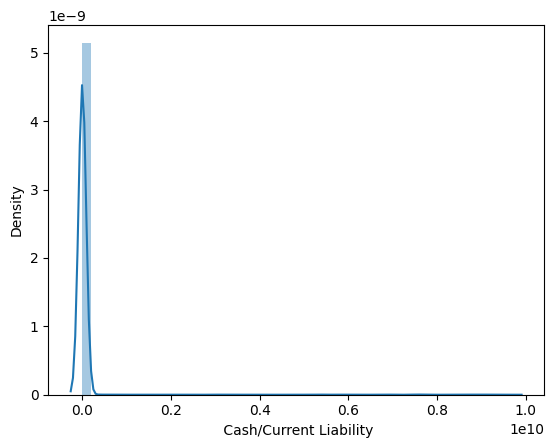

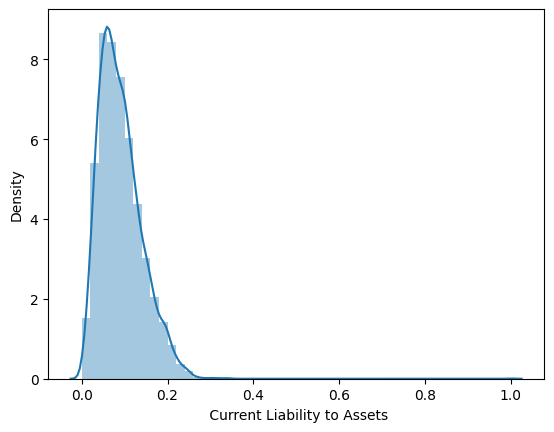

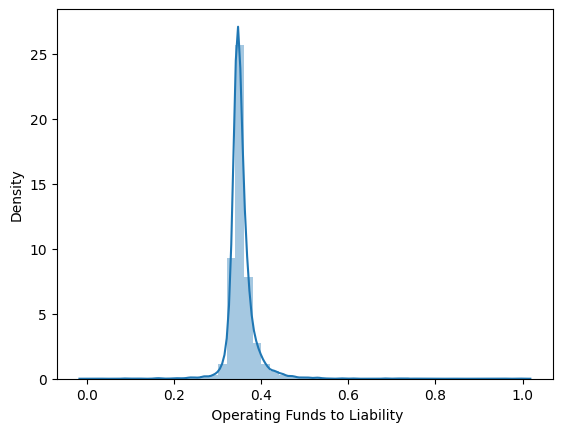

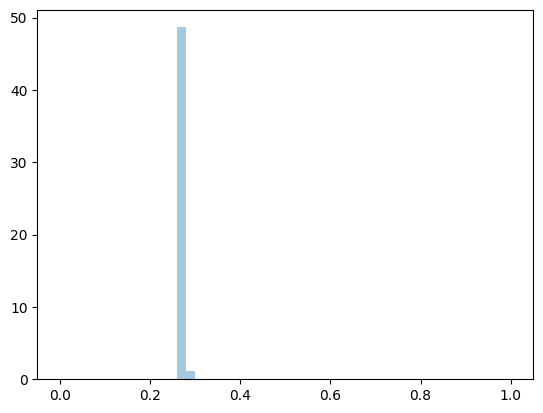

In [11]:
# Iterate over float columns and display progress bar
for col in tqdm(df.select_dtypes('float')):
    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", category=UserWarning)
        plt.figure()
        sns.distplot(df[col])


In [ ]:
Yes = df[df['Bankrupt?'] == 1]
No = df[df['Bankrupt?'] == 0]




`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating you

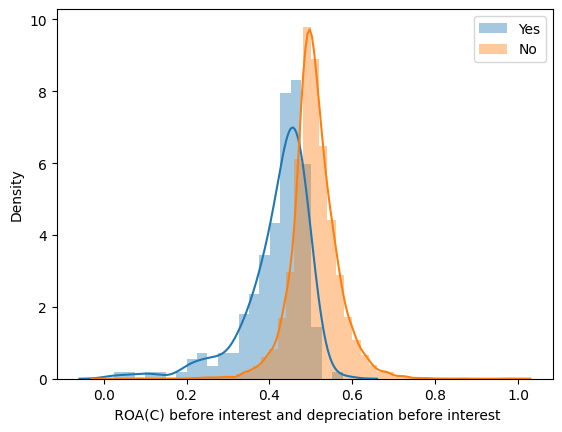

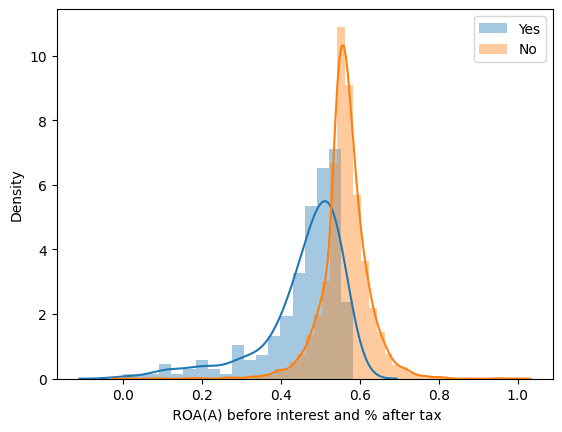

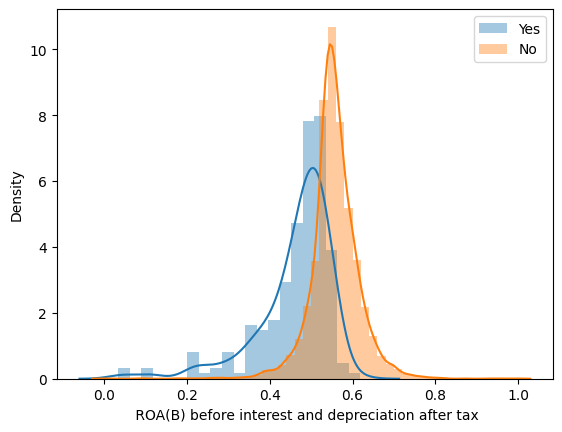

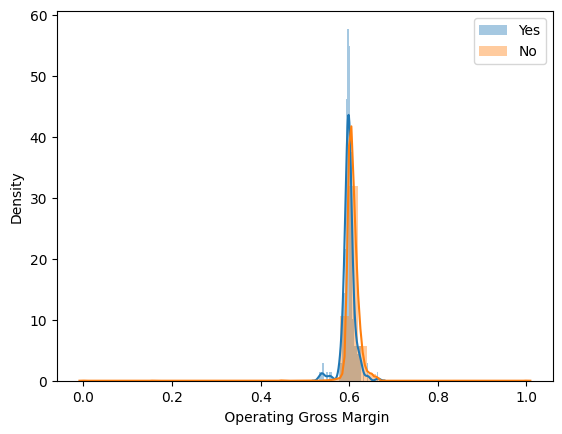

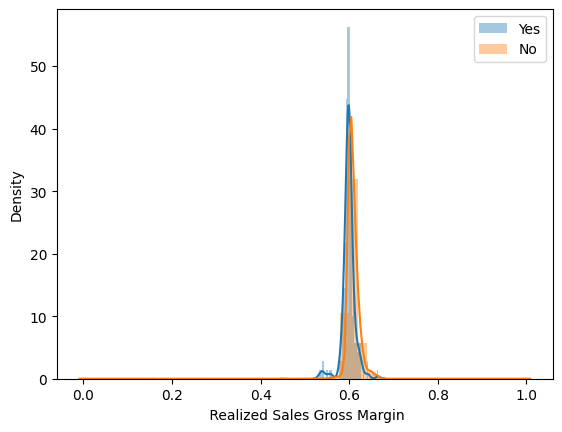

...

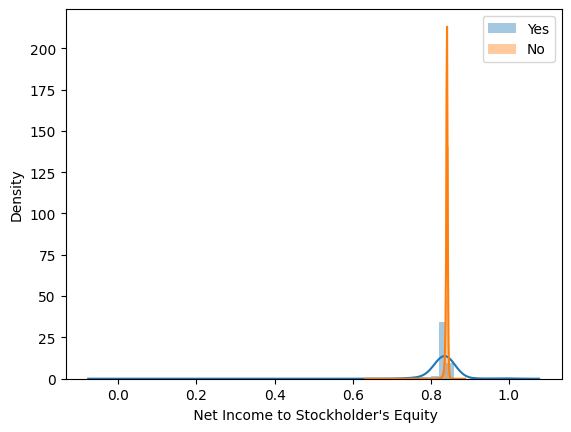

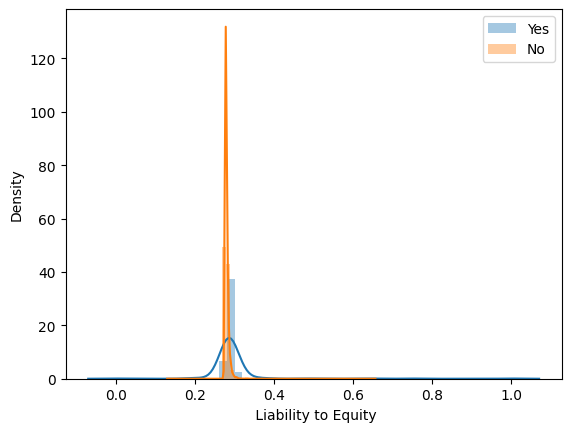

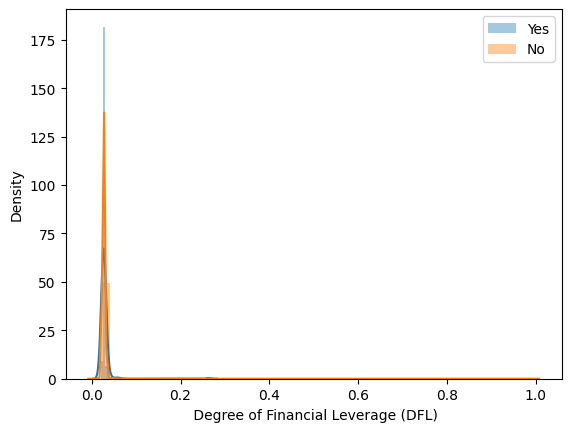

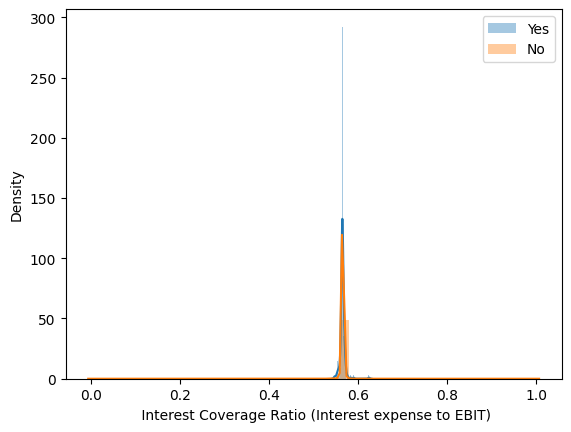

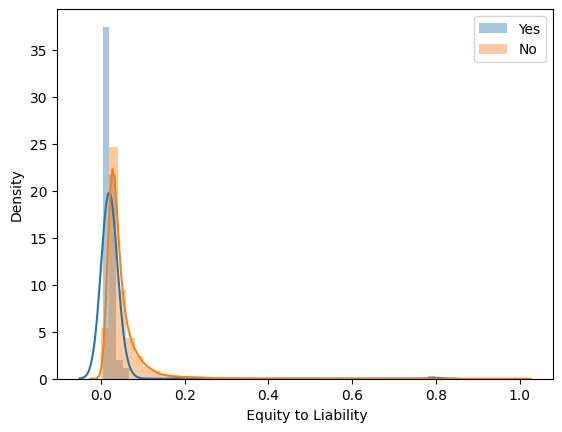

In [ ]:
for col in df.select_dtypes('float'):
    with warnings.catch_warnings():
        plt.figure()
        sns.distplot(Yes[col], label='Yes')
        sns.distplot(No[col], label='No')
        plt.legend()

<Axes: >

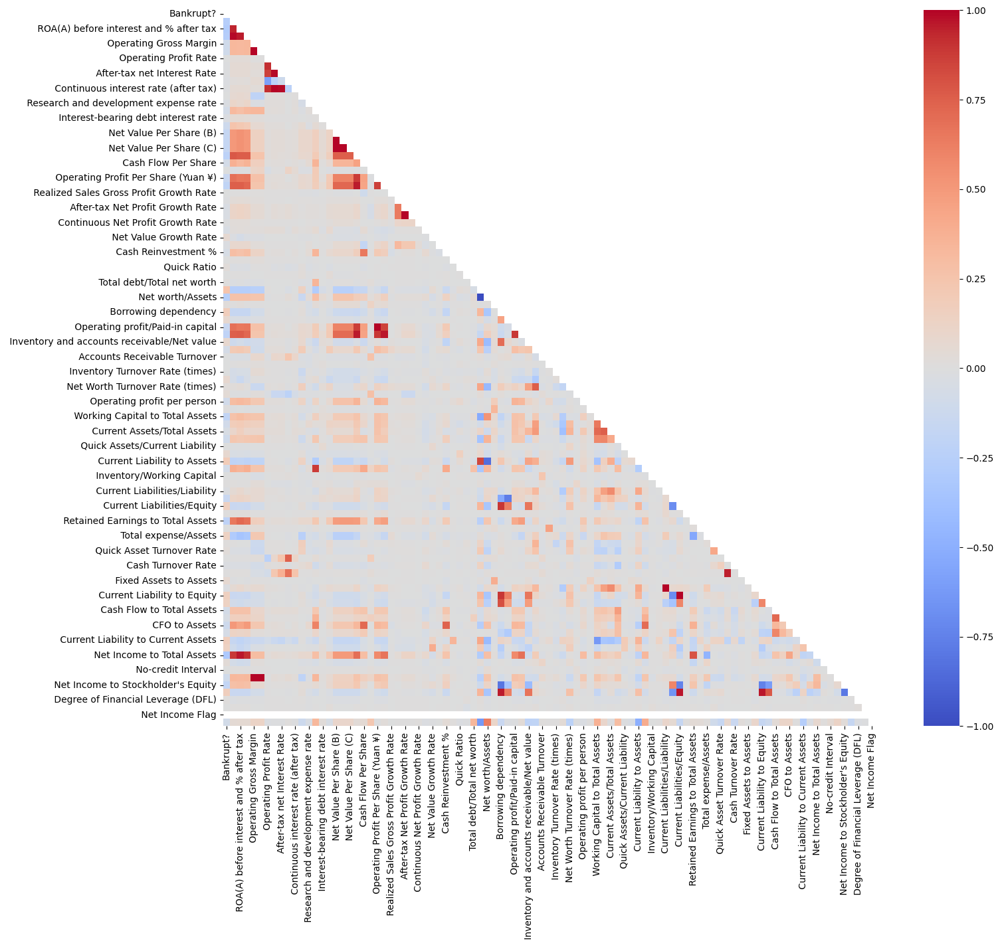

In [ ]:
# Calculer la corrélation entre les variables numériques
corr = df.corr()

# Créer un masque pour cacher la moitié inférieure de la heatmap
mask = np.triu(np.ones_like(corr, dtype=bool))

# Agrandir la figure
plt.figure(figsize=(16, 14))

# Afficher la heatmap en utilisant le masque et en enlevant la barre de couleur à droite
sns.heatmap(corr, annot=False, cmap='coolwarm', mask=mask, cbar=True)


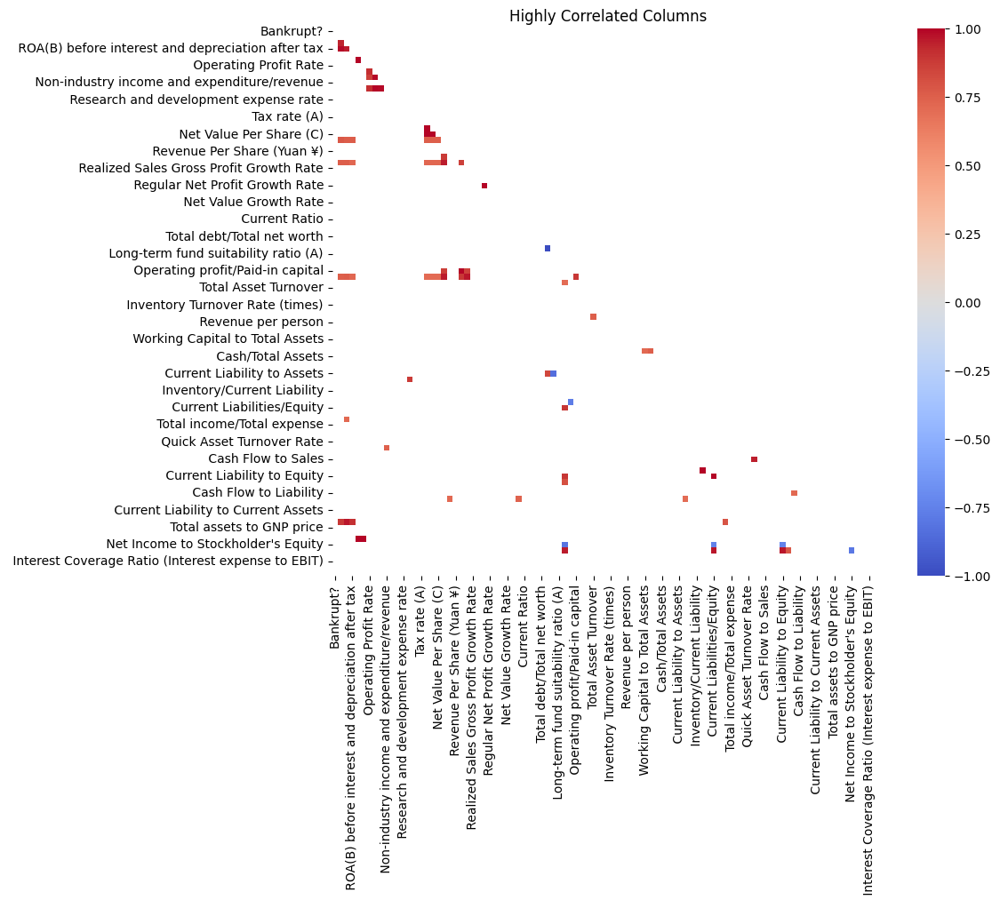

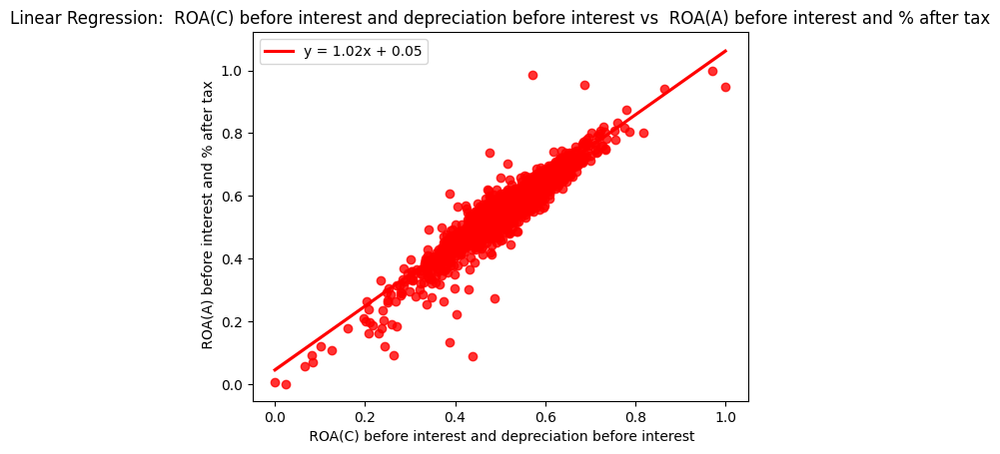

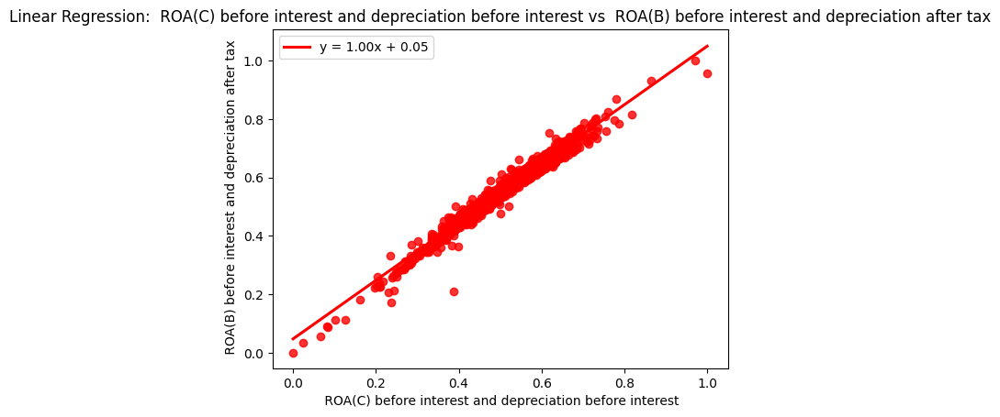

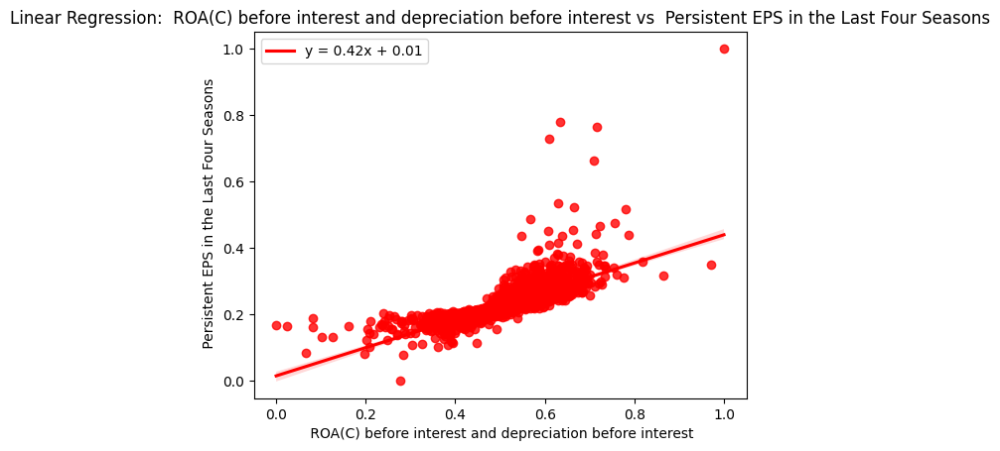

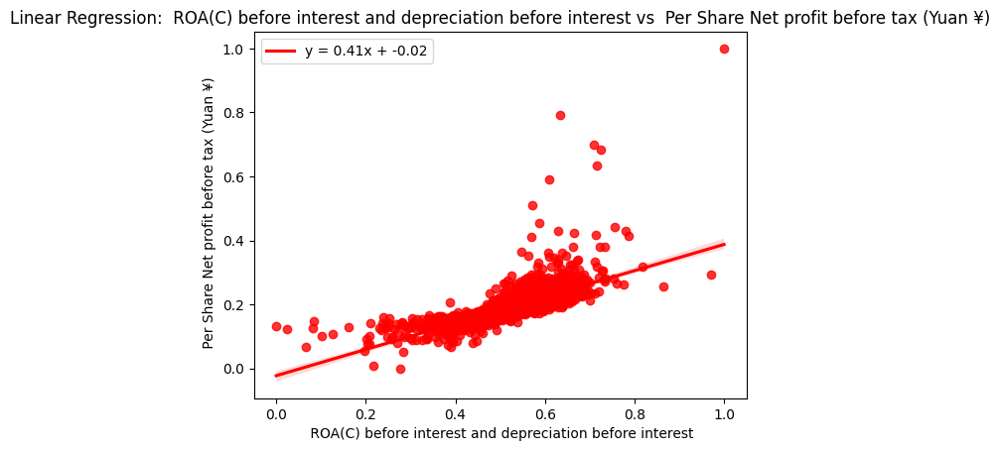

...

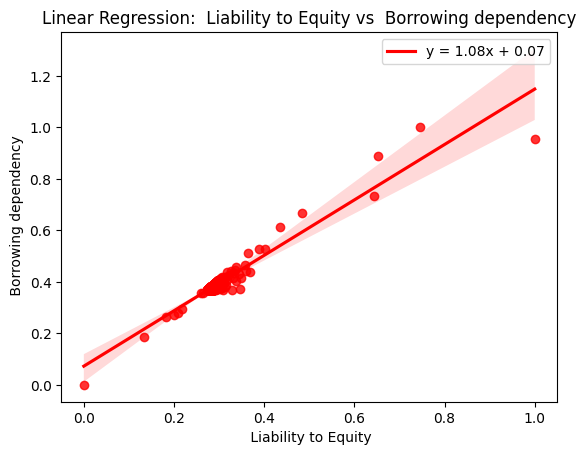

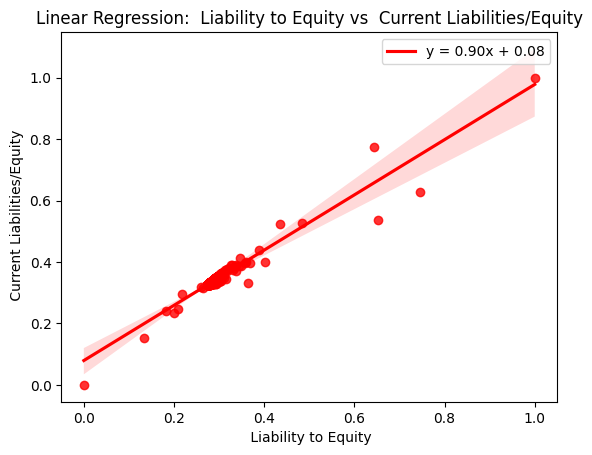

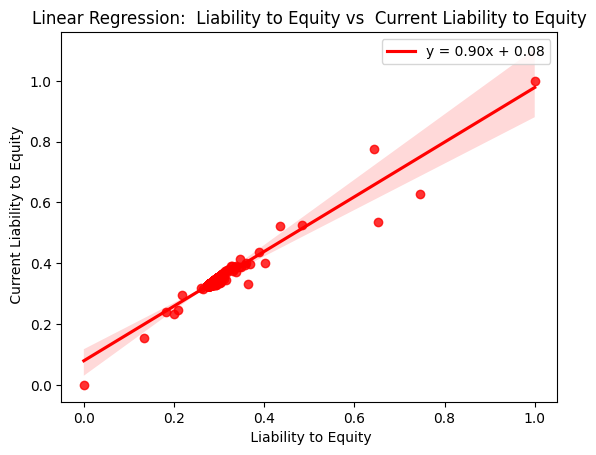

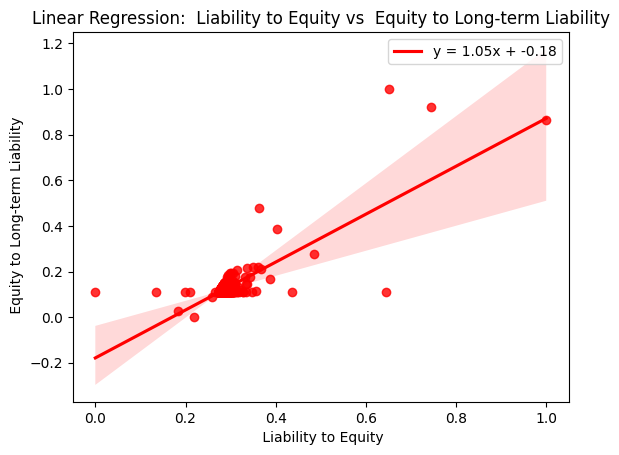

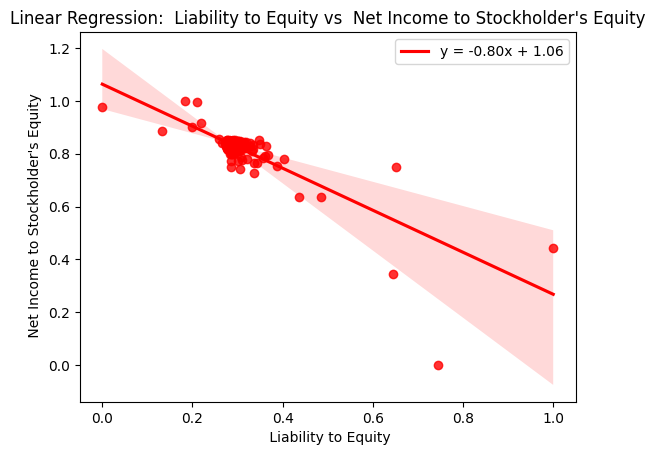

In [ ]:
# Calculate the correlation matrix
corr_matrix = df.corr()

# Filter the correlation matrix to keep only the highly correlated columns
highly_correlated_columns = corr_matrix[(corr_matrix > 0.7) | (corr_matrix < -0.7)]

# Create a mask to hide the lower triangle and the diagonal of the correlation matrix
mask = np.triu(np.ones_like(highly_correlated_columns, dtype=bool))

# Plot the filtered correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(highly_correlated_columns, annot=False, cmap='coolwarm', mask=mask)
plt.title('Highly Correlated Columns')
plt.show()

highly_correlated_pairs = highly_correlated_columns.stack().reset_index()
highly_correlated_pairs.columns = ['Column 1', 'Column 2', 'Correlation']
highly_correlated_pairs = highly_correlated_pairs[highly_correlated_pairs['Correlation'] != 1]
highly_correlated_pairs

# Get the highly correlated column pairs
highly_correlated_pairs = highly_correlated_pairs[['Column 1', 'Column 2']]

# Plot scatter plots for each pair of highly correlated columns with linear regression trend line
for c1, c2 in highly_correlated_pairs.values:
    sns.regplot(data=df, x=c1, y=c2, color='red', line_kws={'label': 'y = {0:.2f}x + {1:.2f}'.format(*np.polyfit(df[c1], df[c2], 1))})
    plt.title(f'Linear Regression: {c1} vs {c2}')
    plt.legend()
    plt.show()



# H0 Hypothesis
## 

In [ ]:
from scipy.stats import ttest_ind
# We must have balanced class between Credit Score

min_value = min(Yes.shape[0], No.shape[0])

Yes_sample = Yes.sample(min_value)
No_sample = No.sample(min_value)

Yes_sample.shape, No_sample.shape

((220, 96), (220, 96))

In [ ]:
def t_test(col, sample1, sample2):
    alpha = 0.02
    stat, p = ttest_ind(sample1[col], sample2[col])
    if p < alpha:
        return 'H0 is rejected'
    else:
        return 0

In [ ]:
columns_accepting_H0 = []
for col in df.select_dtypes('float'):
    result = t_test(col, Yes_sample, No_sample)
    if result != 'H0 is rejected':
        columns_accepting_H0.append(col)
        print(f'{col :-<50} {result}')



 Operating Profit Rate---------------------------- 0
 Pre-tax net Interest Rate------------------------ 0
 After-tax net Interest Rate---------------------- 0
 Non-industry income and expenditure/revenue------ 0
 Operating Expense Rate--------------------------- 0
 Research and development expense rate------------ 0
 Interest-bearing debt interest rate-------------- 0
 Revenue Per Share (Yuan ¥)----------------------- 0
 Realized Sales Gross Profit Growth Rate---------- 0
 Operating Profit Growth Rate--------------------- 0
 Continuous Net Profit Growth Rate---------------- 0
 Total Asset Growth Rate-------------------------- 0
 Net Value Growth Rate---------------------------- 0
 Cash Reinvestment %------------------------------ 0
 Quick Ratio-------------------------------------- 0
 Interest Expense Ratio--------------------------- 0
 Total debt/Total net worth----------------------- 0
 Long-term fund suitability ratio (A)------------- 0
 Contingent liabilities/Net worth-------------

# Modeling

              precision    recall  f1-score   support

           0       0.96      1.00      0.98      1313
           1       0.00      0.00      0.00        51

    accuracy                           0.96      1364
   macro avg       0.48      0.50      0.49      1364
weighted avg       0.93      0.96      0.94      1364



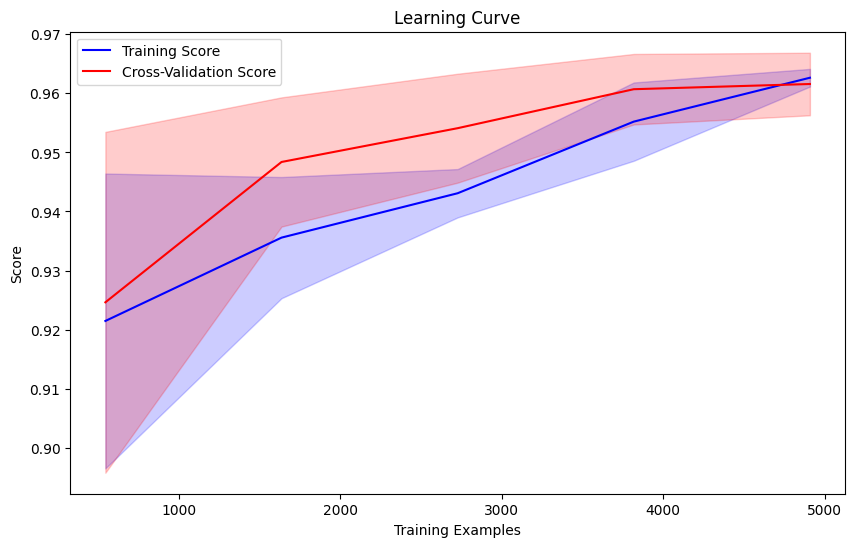

In [ ]:
# Split the data into features (X) and target variable (y)
X = df.drop("Bankrupt?", axis=1)
y = df["Bankrupt?"]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a logistic regression model
model = LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

# Train the model on the training data
model.fit(X_train, y_train)

# Make predictions on the testing data
y_pred = model.predict(X_test)

# Generate the classification report
report = classification_report(y_test, y_pred)

# Print the classification report
print(report)

# Define the number of training examples to use for the learning curve
train_sizes = [0.1, 0.3, 0.5, 0.7, 0.9]

# Calculate the learning curve scores
train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(model, X, y, train_sizes=train_sizes, cv=5, return_times=True)

# Calculate the mean and standard deviation of the training scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)

# Calculate the mean and standard deviation of the test scores
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot the learning curve
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, label='Training Score', color='blue')
plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.2, color='blue')
plt.plot(train_sizes, test_scores_mean, label='Cross-Validation Score', color='red')
plt.fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.2, color='red')
plt.xlabel('Training Examples')
plt.ylabel('Score')
plt.title('Learning Curve')
plt.legend()
plt.show()





<span style="color:red">On peut voir que le déséquilibre des classes impacte énormément le modèle avec une précision, recall et f1 score de 0 pour prédire la classe Bankrupt.</span>


# Feature Engineering - SMOTE (Synthetic Minority Over-sampling Technique)

In [ ]:
smote = SMOTE(random_state=42)
X_res, y_res = smote.fit_resample(X, y)

NameError: name 'SMOTE' is not defined

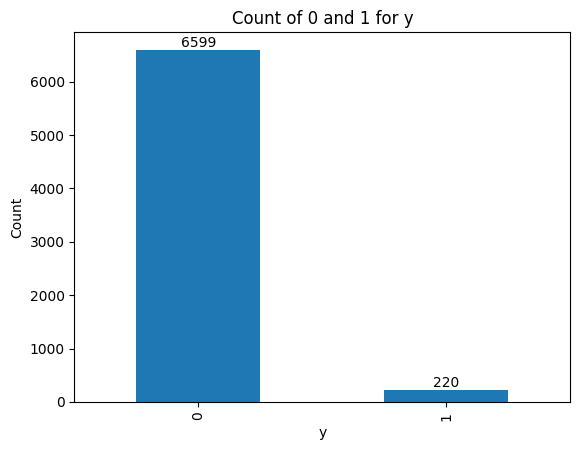

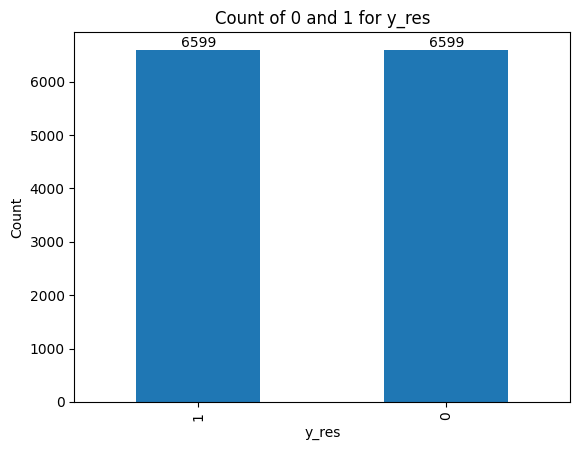

In [ ]:
# Plot the count of 0 and 1 for y
y.value_counts().plot(kind='bar')
plt.xlabel('y')
plt.ylabel('Count')
plt.title('Count of 0 and 1 for y')

# Add value of each bar
for i, v in enumerate(y.value_counts()):
    plt.text(i, v, str(v), ha='center', va='bottom')

plt.show()

# Plot the count of 0 and 1 for y_res
y_res.value_counts().plot(kind='bar')
plt.xlabel('y_res')
plt.ylabel('Count')
plt.title('Count of 0 and 1 for y_res')

# Add value of each bar
for i, v in enumerate(y_res.value_counts()):
    plt.text(i, v, str(v), ha='center', va='bottom')

plt.show()



# Modeling after Feature Engineering


              precision    recall  f1-score   support

           0       0.59      0.73      0.65      1334
           1       0.63      0.48      0.55      1306

    accuracy                           0.61      2640
   macro avg       0.61      0.60      0.60      2640
weighted avg       0.61      0.61      0.60      2640



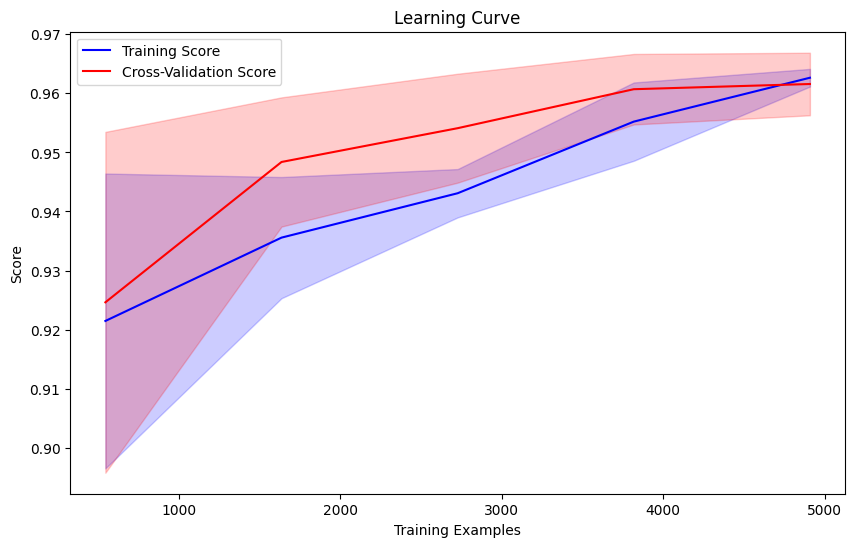

In [ ]:
# Split the data into training and testing sets
X_train_res, X_test_res, y_train_res, y_test_res = train_test_split(X_res, y_res, test_size=0.2, random_state=42)

# Create a logistic regression model
model_res = LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

# Train the model on the training data
model_res.fit(X_train_res, y_train_res)

# Make predictions on the testing data
y_pred_res = model_res.predict(X_test_res)

# Generate the classification report
classification_report_res = classification_report(y_test_res, y_pred_res)

# Print the classification report
print(classification_report_res)

# Define the number of training examples to use for the learning curve
train_sizes = [0.1, 0.3, 0.5, 0.7, 0.9]

# Calculate the learning curve scores
train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(model, X, y, train_sizes=train_sizes, cv=5, return_times=True)

# Calculate the mean and standard deviation of the training scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)

# Calculate the mean and standard deviation of the test scores
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot the learning curve
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, label='Training Score', color='blue')
plt.fill_between(train_sizes, train_scores_mean - train_scores_std, train_scores_mean + train_scores_std, alpha=0.2, color='blue')
plt.plot(train_sizes, test_scores_mean, label='Cross-Validation Score', color='red')
plt.fill_between(train_sizes, test_scores_mean - test_scores_std, test_scores_mean + test_scores_std, alpha=0.2, color='red')
plt.xlabel('Training Examples')
plt.ylabel('Score')
plt.title('Learning Curve')
plt.legend()
plt.show()


In [ ]:
# Split the data into training and testing sets
X_train_res, X_test_res, y_train_res, y_test_res = train_test_split(X_res, y_res, test_size=0.2, random_state=42)

# Create a LightGBM model
model_lgb = lgb.LGBMClassifier()

# Train the model on the training data
model_lgb.fit(X_train_res, y_train_res)

# Make predictions on the testing data
y_pred_res = model_lgb.predict(X_test_res)

# Generate the classification report for the resampled data
classification_report_res = classification_report(y_test_res, y_pred_res)
print("Classification Report for Resampled Data:")
print(classification_report_res)

# Make predictions on the original data
y_pred = model_lgb.predict(X)

# Generate the classification report for the original data
classification_report_orig = classification_report(y, y_pred)
print("Classification Report for Original Data:")
print(classification_report_orig)

# Define the number of training examples to use for the learning curve
train_sizes = [0.1, 0.3, 0.5, 0.7, 0.9]

# Calculate the learning curve scores for the resampled data
train_sizes_res, train_scores_res, test_scores_res, fit_times_res, _ = learning_curve(model_lgb, X_res, y_res, train_sizes=train_sizes, cv=5, return_times=True)

# Calculate the mean and standard deviation of the training scores for the resampled data
train_scores_mean_res = np.mean(train_scores_res, axis=1)
train_scores_std_res = np.std(train_scores_res, axis=1)

# Calculate the mean and standard deviation of the test scores for the resampled data
test_scores_mean_res = np.mean(test_scores_res, axis=1)
test_scores_std_res = np.std(test_scores_res, axis=1)

# Plot the learning curve for the resampled data
plt.figure(figsize=(10, 6))
plt.plot(train_sizes_res, train_scores_mean_res, label='Training Score (Resampled)', color='blue')
plt.fill_between(train_sizes_res, train_scores_mean_res - train_scores_std_res, train_scores_mean_res + train_scores_std_res, alpha=0.2, color='blue')
plt.plot(train_sizes_res, test_scores_mean_res, label='Cross-Validation Score (Resampled)', color='red')
plt.fill_between(train_sizes_res, test_scores_mean_res - test_scores_std_res, test_scores_mean_res + test_scores_std_res, alpha=0.2, color='red')

# Calculate the learning curve scores for the original data
train_sizes_orig, train_scores_orig, test_scores_orig, fit_times_orig, _ = learning_curve(model_lgb, X, y, train_sizes=train_sizes, cv=5, return_times=True)

# Calculate the mean and standard deviation of the training scores for the original data
train_scores_mean_orig = np.mean(train_scores_orig, axis=1)
train_scores_std_orig = np.std(train_scores_orig, axis=1)

# Calculate the mean and standard deviation of the test scores for the original data
test_scores_mean_orig = np.mean(test_scores_orig, axis=1)
test_scores_std_orig = np.std(test_scores_orig, axis=1)

# Plot the learning curve for the original data
plt.plot(train_sizes_orig, train_scores_mean_orig, label='Training Score (Original)', color='green')
plt.fill_between(train_sizes_orig, train_scores_mean_orig - train_scores_std_orig, train_scores_mean_orig + train_scores_std_orig, alpha=0.2, color='green')
plt.plot(train_sizes_orig, test_scores_mean_orig, label='Cross-Validation Score (Original)', color='orange')
plt.fill_between(train_sizes_orig, test_scores_mean_orig - test_scores_std_orig, test_scores_mean_orig + test_scores_std_orig, alpha=0.2, color='orange')

plt.xlabel('Training Examples')
plt.ylabel('Score')
plt.title('Learning Curve')
plt.legend()
plt.show()



NameError: name 'X_res' is not defined

In [ ]:
# Create an explainer object using the trained model and the training data
explainer = shap.Explainer(model_lgb, X_train_res, check_additivity=False)

# Calculate the SHAP values for the testing data
shap_values = explainer.shap_values(X_test_res, check_additivity=False)

# Plot the SHAP values
shap.summary_plot(shap_values, X_test_res)


NameError: name 'model_lgb' is not defined

# Finetuning Model

In [ ]:
# Define the parameter grid
param_grid = {
    'num_leaves': [10, 20, 30],
    'max_depth': [5, 10, 15],
    'learning_rate': [0.1, 0.01, 0.001]
}

# Create the grid search object
grid_search = GridSearchCV(estimator=model_lgb, param_grid=param_grid, cv=5)

# Fit the grid search object to the training data
grid_search.fit(X_train_res, y_train_res)

# Get the best parameters and best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Print the best parameters and best score
print("Best Parameters:", best_params)
print("Best Score:", best_score)


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4234, number of negative: 4212
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002517 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23715
[LightGBM] [Info] Number of data points in the train set: 8446, number of used features: 93
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501302 -> initscore=0.005210
[LightGBM] [Info] Start training from score 0.005210
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4234, number of negative: 4212
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001579 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 23715
[LightGBM] [Info] Number of data points in the train set: 8446, number of used featu

# Saving Model

In [ ]:
# Save the best model
joblib.dump(grid_search.best_estimator_, 'best_model.pkl')


['best_model.pkl']

In [ ]:
financial_features_advice = {
    "ROA(C) before interest and depreciation before interest": "Améliorez l'efficacité opérationnelle pour augmenter les retours sur les actifs.",
    "ROA(A) before interest and % after tax": "Optimisez les coûts et les revenus pour améliorer le retour sur les actifs après impôts.",
    "ROA(B) before interest and depreciation after tax": "Concentrez-vous sur la réduction des dépenses pour améliorer le ROA après impôts.",
    "Operating Gross Margin": "Augmentez les prix ou réduisez les coûts des marchandises vendues pour améliorer la marge brute.",
    "Realized Sales Gross Margin": "Analysez les tendances des ventes pour identifier les produits les plus rentables.",
    "Operating Profit Rate": "Optimisez les opérations pour augmenter le taux de profit opérationnel.",
    "Pre-tax net Interest Rate": "Réduisez les dettes coûteuses pour diminuer les charges d'intérêts avant impôts.",
    "After-tax net Interest Rate": "Renégociez les conditions de prêt pour réduire les charges d'intérêts après impôts.",
    "Non-industry income and expenditure/revenue": "Diversifiez les sources de revenus en dehors de l'industrie principale.",
    "Continuous interest rate (after tax)": "Maintenez un taux d'intérêt stable pour prévoir les dépenses futures.",
    "Operating Expense Rate": "Réduisez les dépenses opérationnelles inutiles pour améliorer la rentabilité.",
    "Research and development expense rate": "Investissez judicieusement en R&D pour favoriser l'innovation durable.",
    "Cash flow rate": "Améliorez la gestion des liquidités pour maintenir un flux de trésorerie positif.",
    "Interest-bearing debt interest rate": "Réduisez ou renégociez les dettes à intérêt élevé.",
    "Tax rate (A)": "Explorez les stratégies de planification fiscale pour réduire les obligations fiscales.",
    "Net Value Per Share (B)": "Augmentez la valeur nette par action en améliorant les fondamentaux de l'entreprise.",
    "Net Value Per Share (A)": "Concentrez-vous sur la croissance à long terme pour augmenter la valeur nette par action.",
    "Net Value Per Share (C)": "Maintenez un bilan solide pour améliorer la valeur nette par action.",
    "Persistent EPS in the Last Four Seasons": "Visez une croissance constante du bénéfice par action sur plusieurs périodes.",
    "Cash Flow Per Share": "Améliorez la génération de flux de trésorerie par action.",
    "Revenue Per Share (Yuan ¥)": "Augmentez les revenus pour améliorer le revenu par action.",
    "Operating Profit Per Share (Yuan ¥)": "Optimisez les opérations pour augmenter le bénéfice opérationnel par action.",
    "Per Share Net profit before tax (Yuan ¥)": "Augmentez le profit net avant impôts par action.",
    "Realized Sales Gross Profit Growth Rate": "Concentrez-vous sur l'augmentation du taux de croissance du bénéfice brut des ventes réalisées.",
    "Operating Profit Growth Rate": "Visez une croissance soutenue du bénéfice opérationnel.",
    "After-tax Net Profit Growth Rate": "Maximisez le taux de croissance du profit net après impôts.",
    "Regular Net Profit Growth Rate": "Maintenez une croissance régulière du profit net.",
    "Continuous Net Profit Growth Rate": "Visez une croissance continue du profit net sur le long terme.",
    "Total Asset Growth Rate": "Augmentez le taux de croissance des actifs totaux pour renforcer le bilan.",
    "Net Value Growth Rate": "Améliorez le taux de croissance de la valeur nette pour renforcer la santé financière.",
    "Total Asset Return Growth Rate Ratio": "Augmentez le rendement des actifs totaux pour améliorer la rentabilité.",
    "Cash Reinvestment %": "Réinvestissez judicieusement un pourcentage des flux de trésorerie pour favoriser la croissance.",
    "Current Ratio": "Maintenez un ratio de liquidité suffisant pour couvrir les passifs à court terme.",
    "Quick Ratio": "Améliorez le ratio rapide pour mieux gérer les passifs à court terme avec des actifs liquides.",
    "Interest Expense Ratio": "Réduisez le ratio des charges d'intérêts pour améliorer la rentabilité.",
    "Total debt/Total net worth": "Réduisez le niveau d'endettement global pour améliorer la structure du capital.",
    "Debt ratio %": "Diminuez le pourcentage de dette pour réduire le risque financier.",
    "Net worth/Assets": "Améliorez le ratio de la valeur nette sur les actifs pour une meilleure stabilité financière.",
    "Long-term fund suitability ratio (A)": "Assurez une adéquation appropriée des fonds à long terme pour la stabilité financière.",
    "Borrowing dependency": "Réduisez la dépendance à l'emprunt pour diminuer le risque financier.",
    "Contingent liabilities/Net worth": "Contrôlez les passifs éventuels par rapport à la valeur nette pour gérer les risques.",
    "Operating profit/Paid-in capital": "Améliorez le ratio de profit opérationnel sur le capital versé pour une meilleure rentabilité.",
    "Net profit before tax/Paid-in capital": "Augmentez le profit net avant impôts par rapport au capital versé.",
    "Inventory and accounts receivable/Net value": "Gérez efficacement les stocks et les comptes clients pour optimiser la valeur nette.",
    "Total Asset Turnover": "Améliorez le taux de rotation des actifs pour une utilisation plus efficace des actifs.",
    "Accounts Receivable Turnover": "Accélérez le turnover des comptes clients pour améliorer la liquidité.",
    "Average Collection Days": "Réduisez les jours moyens de recouvrement pour améliorer la gestion de la trésorerie.",
    "Inventory Turnover Rate (times)": "Optimisez le taux de rotation des stocks pour une meilleure gestion des stocks.",
    "Fixed Assets Turnover Frequency": "Améliorez la fréquence de rotation des actifs fixes pour une utilisation plus efficace.",
    "Net Worth Turnover Rate (times)": "Augmentez le taux de rotation de la valeur nette pour une meilleure performance financière.",
    "Revenue per person": "Augmentez les revenus par employé pour une plus grande efficacité.",
    "Operating profit per person": "Améliorez le profit opérationnel par employé pour une meilleure productivité.",
    "Allocation rate per person": "Optimisez l'allocation des ressources par employé pour une meilleure efficacité.",
    "Working Capital to Total Assets": "Maintenez un capital de roulement adéquat par rapport aux actifs totaux pour la stabilité opérationnelle.",
    "Quick Assets/Total Assets": "Assurez un niveau adéquat d'actifs liquides par rapport aux actifs totaux pour la liquidité.",
    "Current Assets/Total Assets": "Maintenez un bon équilibre entre actifs courants et actifs totaux pour la flexibilité financière.",
    "Cash/Total Assets": "Assurez un niveau de liquidités suffisant dans le total des actifs pour la stabilité financière.",
    "Quick Assets/Current Liability": "Gérez les actifs liquides pour couvrir efficacement les passifs à court terme.",
    "Cash/Current Liability": "Assurez suffisamment de liquidités pour couvrir les passifs à court terme.",
    "Current Liability to Assets": "Contrôlez le niveau de passifs courants par rapport aux actifs pour gérer le risque.",
    "Operating Funds to Liability": "Assurez que les fonds opérationnels sont suffisants pour couvrir les passifs.",
    "Inventory/Working Capital": "Gérez les stocks par rapport au capital de roulement pour une efficacité opérationnelle.",
    "Inventory/Current Liability": "Équilibrez les stocks par rapport aux passifs à court terme pour une meilleure gestion financière.",
    "Current Liabilities/Liability": "Gérez les passifs courants par rapport au total des passifs pour une structure de dette équilibrée.",
    "Working Capital/Equity": "Maintenez un capital de roulement sain par rapport aux capitaux propres pour la stabilité financière.",
    "Current Liabilities/Equity": "Maintenez un niveau de passifs courants adéquat par rapport aux capitaux propres.",
    "Long-term Liability to Current Assets": "Maintenez un niveau de passifs à long terme adéquat par rapport aux actifs courants.",
    "Retained Earnings to Total Assets": "Maintenez un niveau adéquat de bénéfices non distribués par rapport aux actifs totaux.",
    "Total income/Total expense": "Maintenez un ratio adéquat des revenus aux dépenses pour la rentabilité.",
    "Total expense/Assets": "Maintenez un ratio adéquat des dépenses aux actifs pour la rentabilité.",
    "Current Asset Turnover Rate": "Maintenez un ratio adéquat des actifs courants pour une meilleure utilisation des actifs.",
    "Quick Asset Turnover Rate": "Maintenez un ratio adéquat des actifs liquides pour une meilleure utilisation des actifs.",
    "Working capitcal Turnover Rate": "Maintenez un ratio adéquat du capital de roulement pour une meilleure utilisation des actifs.",
    "Cash Turnover Rate": "Maintenez un ratio adéquat de liquidités pour une meilleure utilisation des actifs.",
    "Cash Flow to Sales": "Maintenez un ratio adéquat de flux de trésorerie sur les ventes pour la rentabilité.",
    "Fixed Assets to Assets": "Maintenez un ratio adéquat des actifs fixes pour une meilleure utilisation des actifs.",
    "Current Liability to Liability": "Maintenez un ratio adéquat des passifs courants pour une meilleure gestion des passifs.",
    "Current Liability to Equity": "Maintenez un ratio adéquat des passifs courants par rapport aux capitaux propres.",
    "Equity to Long-term Liability": "Maintenez un ratio adéquat des capitaux propres par rapport aux passifs à long terme.",
    "Cash Flow to Total Assets": "Maintenez un ratio adéquat de flux de trésorerie par rapport aux actifs totaux pour la rentabilité.",
    "Cash Flow to Liability": "Maintenez un ratio adéquat de flux de trésorerie par rapport aux passifs pour la rentabilité.",
    "CFO to Assets": "Maintenez un ratio adéquat de flux de trésorerie provenant des opérations par rapport aux actifs pour la rentabilité.",
    "Cash Flow to Equity": "Maintenez un ratio adéquat de flux de trésorerie par rapport aux capitaux propres pour la rentabilité.",
    "Current Liability to Current Assets": "Maintenez un ratio adéquat des passifs courants par rapport aux actifs courants.",
    "Operating Funds to Liability": "Maintenez un ratio adéquat des fonds opérationnels par rapport aux passifs.",
    "Inventory Turnover Days": "Maintenez un ratio adéquat de rotation des stocks pour une meilleure gestion des stocks.",
    "Accounts Receivable Turnover Days": "Maintenez un ratio adéquat de rotation des comptes clients pour une meilleure gestion des comptes clients.",
    "Average Collection Days": "Maintenez un ratio adéquat de recouvrement moyen pour une meilleure gestion des comptes clients.",
    "Inventory/Cost of Goods Sold": "Maintenez un ratio adéquat des stocks par rapport au coût des marchandises vendues.",
    "Inventory/Current Assets": "Maintenez un ratio adéquat des stocks par rapport aux actifs courants.",
    "Current Assets/Total Assets": "Maintenez un ratio adéquat des actifs courants par rapport aux actifs totaux.",
    "Current Assets/Equity": "Maintenez un ratio adéquat des actifs courants par rapport aux capitaux propres.",
    "Long-term Liability to Current Assets": "Maintenez un ratio adéquat des passifs à long terme par rapport aux actifs courants.",
    "Retained Earnings to Total Assets": "Maintenez un ratio adéquat des bénéfices non distribués par rapport aux actifs totaux.",
    "Total income/Total expense": "Maintenez un ratio adéquat des revenus aux dépenses pour la rentabilité.",
    "Total expense/Assets": "Maintenez un ratio adéquat des dépenses aux actifs pour la rentabilité."}
    


In [3]:
from flask import Flask, request, render_template
import pandas as pd
import joblib
from sklearn.metrics import classification_report, confusion_matrix

app = Flask(__name__)

# Load the trained model
model = joblib.load('best_model.pkl')

@app.route('/', methods=['GET', 'POST'])
def upload_file():
    if request.method == 'POST':
        file = request.files['file']
        if file:
            # Read the uploaded CSV file into a pandas dataframe
            df = pd.read_csv(file)
            
            # Make predictions using the model
            predictions = model.predict(df)
            probabilities = model.predict_proba(df)[:, 1]
            
            # Create a new dataframe with the predictions and probabilities
            result_df = pd.DataFrame({'Prediction': predictions, 'Probability': probabilities})

            # Map the prediction values to the corresponding labels
            result_df['Prediction'] = result_df['Prediction'].map({0: 'Not in Bankruptcy', 1: 'Bankruptcy'})

            # Convert the probabilities to percentages with 2 decimal places
            result_df['Probability'] = (result_df['Probability'] * 100).round(2)

            # Create a SHAP explainer
            explainer = shap.Explainer(model)
            
            # Calculate SHAP values
            shap_values = explainer.shap_values(df)[1]

            
            # Create a SHAP summary plot and save it as an image
            shap.summary_plot(shap_values, df, show=False)
            plt.savefig('static/shap.png')

            
            # Render the result dataframe in HTML table format
            return render_template('results.html', table=result_df.to_html(index=False))
    return render_template('upload.html')

if __name__ == '__main__':
    app.run()


 * Serving Flask app '__main__'
 * Debug mode: off


 * Running on http://127.0.0.1:5000
Press CTRL+C to quit


127.0.0.1 - - [11/Jan/2024 16:53:55] "GET / HTTP/1.1" 200 -
LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
127.0.0.1 - - [11/Jan/2024 16:54:03] "POST / HTTP/1.1" 200 -
127.0.0.1 - - [11/Jan/2024 16:54:03] "GET /static/shap.png HTTP/1.1" 200 -
